# MÉTODO DE ENTRADA DE VENTANA SÓLO VALOR 8640 - 2880

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

In [2]:
import tensorflow as tf
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
from array import *
from pickle import dump
import math

import numpy as np
import pandas as pd
import seaborn as sns

np.random.seed(123)

from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [3]:
FILEPATH = "../../datasources/THC-id-17.csv"
df_original = pd.read_csv(FILEPATH, parse_dates=True)

FILEPATH = "../../datasources/THC-id-17-preprocessed.csv"
df = pd.read_csv(FILEPATH, parse_dates=True)

In [4]:
df_original

,datetime,id,value
0,2019-01-01 03:00:00,17.0,0.087
1,2019-01-01 03:15:00,17.0,0.100
2,2019-01-01 03:30:00,17.0,0.084
3,2019-01-01 03:45:00,17.0,0.057
4,2019-01-01 04:00:00,17.0,0.167
...,...,...,...
64588,2020-11-03 22:00:00,17.0,0.031
64589,2020-11-03 22:15:00,17.0,0.055
64590,2020-11-03 22:30:00,17.0,0.019
64591,2020-11-03 22:45:00,17.0,0.021


In [5]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


In [6]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


### División de los datos

In [7]:
train_df, aux = train_test_split(df, test_size=0.4, shuffle=False)
test_df, val_df = train_test_split(aux, test_size=0.5, shuffle=False)

In [8]:
train_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
38750,-0.991445,0.130526,0.608761,-0.793353,0.616914,0.787031,0.074
38751,-0.980785,0.195090,0.601317,-0.799010,0.617055,0.786920,0.071
38752,-0.965926,0.258819,0.593820,-0.804598,0.617196,0.786809,0.071
38753,-0.946930,0.321439,0.586271,-0.810115,0.617337,0.786699,0.067


In [9]:
test_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
38755,-0.896873,0.442289,0.571021,-0.820936,0.617619,0.786477,0.058
38756,-0.866025,0.500000,0.563320,-0.826239,0.617760,0.786367,0.056
38757,-0.831470,0.555570,0.555570,-0.831470,0.617901,0.786256,0.057
38758,-0.793353,0.608761,0.547772,-0.836628,0.618042,0.786145,0.057
38759,-0.751840,0.659346,0.539926,-0.841713,0.618183,0.786035,0.056
...,...,...,...,...,...,...,...
51669,0.831470,-0.555570,-0.686997,-0.726660,0.161045,-0.986947,0.027
51670,0.793353,-0.608761,-0.693761,-0.720205,0.160868,-0.986976,0.028
51671,0.751840,-0.659346,-0.700465,-0.713687,0.160691,-0.987005,0.027
51672,0.707107,-0.707107,-0.707107,-0.707107,0.160514,-0.987034,0.028


In [10]:
val_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
51674,0.608761,-0.793353,-0.720205,-0.693761,0.160160,-0.987091,0.027
51675,0.555570,-0.831470,-0.726660,-0.686997,0.159984,-0.987120,0.028
51676,0.500000,-0.866025,-0.733052,-0.680173,0.159807,-0.987148,0.027
51677,0.442289,-0.896873,-0.739379,-0.673289,0.159630,-0.987177,0.010
51678,0.382683,-0.923880,-0.745642,-0.666347,0.159453,-0.987206,0.014
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


## Funciones auxiliares

In [11]:
def split_data(data, n_input, n_out):
    X, y = list(), list()
    in_start = 0
    
    for _ in range(len(data)):
        in_end = in_start + n_input
        out_end = in_end + n_out
        if out_end <= len(data):
            X.append(np.array(data.iloc[in_start:in_end, -1]))
            y.append(np.array(data.iloc[in_end:out_end, -1]))
        in_start += 1
        
    return np.array(X).reshape(len(X), n_input, 1), np.array(y)

In [12]:
def plot_history(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Abs Error [MPG]')
    plt.plot(hist['epoch'], hist['mae'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mae'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Square Error [$MPG^2$]')
    plt.plot(hist['epoch'], hist['mse'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mse'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.show()

In [13]:
def plot_window_predictions(index_min, index_max, real_outputs, pred_outputs, num_plots, start):
    for n in range(start, start + num_plots):
        limit = index_min + n + n_entrada
        input_indices = np.array(df_original['datetime'].iloc[index_min + n : limit])
        input_values = np.array(df_original['value'].iloc[index_min + n : limit])
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        real_values = real_outputs[n]
        pred_values = pred_outputs[n]
        
        plt.figure()
        plt.xlabel('Time')
        plt.ylabel(f'Valores de prediccion - Iteracion {n+1}')
        plt.scatter(input_indices, input_values, color='b',zorder=2)
        plt.plot(input_indices, input_values, label='Inputs', color='b', zorder=1)
        plt.scatter(output_indices, real_values, edgecolors='k', label='Real output', c='#2ca02c', s=64)
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)
        plt.legend()

In [14]:
def plot_window_predictions_values(index_min, pred_outputs, max_plots):
    plt.figure()
    plt.xlabel('Time')
    plt.ylabel(f'Valores de prediccion')
    plt.plot(np.array(df_original['datetime'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             np.array(df_original['value'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             color='b', zorder=1)
    
    for n in range(max_plots):
        limit = index_min + n + n_entrada
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        pred_values = pred_outputs[n]
        
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)

In [15]:
import tensorflow.keras.backend as K

def smape(y_true, y_pred):
    return K.mean(2*K.abs(y_pred-y_true)/(K.abs(y_true)+K.abs(y_pred)))

## Parámetros
####  En este caso vamos a generar una ventana de 2016 valores de entrada que corresponde a las 3 semanas anteriores y una salida de 672 valores que corresponden al consumo de la siguiente semana

In [16]:
###### PARAMETERS ######
n_epochs = 200
batch_size = 128
n_entrada = 8640           # Número de mediciones en las 3 semanas anteriores
n_predicciones = 2880       # Mediciones en una semana
n_features = 1
########################

## Extraer datos de entrada y salida

In [17]:
data_trainX, data_trainY = split_data(train_df, n_entrada, n_predicciones)
data_valX, data_valY = split_data(val_df, n_entrada, n_predicciones)
data_testX, data_testY = split_data(test_df, n_entrada, n_predicciones)

In [18]:
data_trainX.shape

(27236, 8640, 1)

In [19]:
data_trainY.shape

(27236, 2880)

In [20]:
data_valX.shape

(1400, 8640, 1)

In [21]:
data_valY.shape

(1400, 2880)

In [22]:
data_testX.shape

(1400, 8640, 1)

In [23]:
data_testY.shape

(1400, 2880)

In [24]:
data_trainX[0]

array([[0.087],
       [0.1  ],
       [0.084],
       ...,
       [0.043],
       [0.074],
       [0.142]])

In [25]:
data_trainY[0]

array([0.012, 0.035, 0.004, ..., 0.296, 0.027, 0.032])

## Estandarización y normalización de los datos

In [26]:
# Normalizado
maxabs_scaler = MaxAbsScaler()
    
maxabs_scaler.fit(data_trainX.reshape(-1, data_trainX.shape[-1]))
    
scaled_trainX = maxabs_scaler.transform(data_trainX.reshape(-1, data_trainX.shape[-1])).reshape(data_trainX.shape)
scaled_valX = maxabs_scaler.transform(data_valX.reshape(-1, data_valX.shape[-1])).reshape(data_valX.shape)
scaled_testX = maxabs_scaler.transform(data_testX.reshape(-1, data_testX.shape[-1])).reshape(data_testX.shape)

In [27]:
scaled_trainX.shape

(27236, 8640, 1)

In [28]:
scaled_valX.shape

(1400, 8640, 1)

In [29]:
scaled_testX.shape

(1400, 8640, 1)

In [30]:
scaled_trainX[0]

array([[0.12869822],
       [0.14792899],
       [0.12426036],
       ...,
       [0.06360947],
       [0.10946746],
       [0.21005917]])

### Algunos modelos necesitan otros tipos de entrada

In [31]:
scaled_trainX_4D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, n_entrada, n_features)
scaled_valX_4D = scaled_valX.reshape(scaled_valX.shape[0], 1, n_entrada, n_features)
scaled_testX_4D = scaled_testX.reshape(scaled_testX.shape[0], 1, n_entrada, n_features)

scaled_trainX_5D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, 1, n_entrada, n_features)
scaled_valX_5D = scaled_valX.reshape(scaled_valX.shape[0], 1, 1, n_entrada, n_features)
scaled_testX_5D = scaled_testX.reshape(scaled_testX.shape[0], 1, 1, n_entrada, n_features)

data_trainY_3D = data_trainY.reshape(data_trainY.shape[0], 1, n_predicciones)
data_valY_3D = data_valY.reshape(data_valY.shape[0], 1, n_predicciones)
data_testY_3D = data_testY.reshape(data_testY.shape[0], 1, n_predicciones)

data_trainY_3D_2 = data_trainY.reshape(data_trainY.shape[0], n_predicciones, 1)
data_valY_3D_2 = data_valY.reshape(data_valY.shape[0], n_predicciones, 1)
data_testY_3D_2 = data_testY.reshape(data_testY.shape[0], n_predicciones, 1)

### Early stopping

In [32]:
early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)

# MODELO 2: LSTM DE DOS CAPAS

### Construimos el modelo

In [33]:
def build_model2():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [34]:
model2 = build_model2()
model2.summary()

2022-06-25 15:50:59.768122: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-25 15:51:00.286000: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30514 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:d7:00.0, compute capability: 7.0


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 8640, 128)         66560     
                                                                 
 lstm_1 (LSTM)               (None, 128)               131584    
                                                                 
 dense (Dense)               (None, 2880)              371520    
                                                                 
Total params: 569,664
Trainable params: 569,664
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [35]:
history2 = model2.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200


2022-06-25 15:51:05.436155: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8100


213/213 [==============================] - 187s 862ms/step - loss: 0.0071 - mae: 0.0502 - mse: 0.0071 - smape: 0.9344 - val_loss: 0.0066 - val_mae: 0.0505 - val_mse: 0.0066 - val_smape: 1.0390
Epoch 2/200
213/213 [==============================] - 184s 862ms/step - loss: 0.0062 - mae: 0.0477 - mse: 0.0062 - smape: 0.8792 - val_loss: 0.0068 - val_mae: 0.0496 - val_mse: 0.0068 - val_smape: 0.9865
Epoch 3/200
213/213 [==============================] - 183s 861ms/step - loss: 0.0060 - mae: 0.0462 - mse: 0.0060 - smape: 0.8451 - val_loss: 0.0068 - val_mae: 0.0489 - val_mse: 0.0068 - val_smape: 0.9682
Epoch 4/200
213/213 [==============================] - 183s 860ms/step - loss: 0.0059 - mae: 0.0453 - mse: 0.0059 - smape: 0.8287 - val_loss: 0.0067 - val_mae: 0.0486 - val_mse: 0.0067 - val_smape: 0.9670
Epoch 5/200
213/213 [==============================] - 184s 864ms/step - loss: 0.0057 - mae: 0.0443 - mse: 0.0057 - smape: 0.8163 - val_loss: 0.0065 - val_mae: 0.0478 - val_mse: 0.0065 - val_s

In [36]:
hist2 = pd.DataFrame(history2.history)
hist2['epoch'] = history2.epoch
hist2

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.007083,0.050207,0.007083,0.934362,0.006629,0.050466,0.006629,1.039035,0
1,0.006242,0.047677,0.006242,0.879195,0.006755,0.049564,0.006755,0.986549,1
2,0.005971,0.046171,0.005971,0.845088,0.006784,0.048911,0.006784,0.968172,2
3,0.005853,0.045341,0.005853,0.828685,0.006682,0.048573,0.006682,0.967018,3
4,0.005698,0.044317,0.005698,0.816288,0.006497,0.047786,0.006497,0.977620,4
...,...,...,...,...,...,...,...,...,...
84,0.005135,0.041465,0.005135,0.783135,0.006681,0.050518,0.006681,1.009442,84
85,0.005141,0.041503,0.005141,0.783861,0.006479,0.049499,0.006479,0.993989,85
86,0.005130,0.041440,0.005130,0.783019,0.006616,0.050109,0.006616,1.002967,86
87,0.005133,0.041461,0.005133,0.783394,0.006705,0.050501,0.006705,1.010446,87


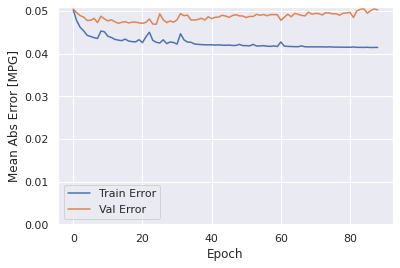

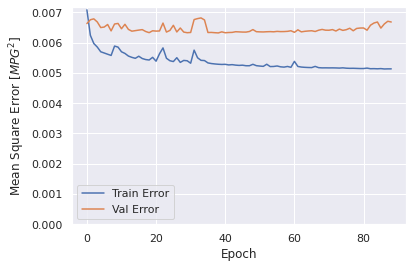

In [37]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history2)

### Evaluar predicciones

In [38]:
score_train2 = model2.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train2[0]}')
print(f'MAE:{score_train2[1]}')
print(f'MSE:{score_train2[2]}')
print(f'SMAPE:{score_train2[3]}')

852/852 [==============================] - 224s 263ms/step - loss: 0.0051 - mae: 0.0416 - mse: 0.0051 - smape: 0.7843
Loss:0.00511132413521409
MAE:0.041589900851249695
MSE:0.00511132413521409
SMAPE:0.7843256592750549


In [39]:
score_val2 = model2.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val2[0]}')
print(f'MAE:{score_val2[1]}')
print(f'MSE:{score_val2[2]}')
print(f'SMAPE:{score_val2[3]}')

44/44 [==============================] - 12s 264ms/step - loss: 0.0067 - mae: 0.0503 - mse: 0.0067 - smape: 1.0060
Loss:0.006680216174572706
MAE:0.05027102306485176
MSE:0.006680216174572706
SMAPE:1.006028413772583


In [40]:
score_test2 = model2.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test2[0]}')
print(f'MAE:{score_test2[1]}')
print(f'MSE:{score_test2[2]}')
print(f'SMAPE:{score_test2[3]}')

44/44 [==============================] - 12s 264ms/step - loss: 0.0057 - mae: 0.0491 - mse: 0.0057 - smape: 0.9843
Loss:0.00565211521461606
MAE:0.049131520092487335
MSE:0.00565211521461606
SMAPE:0.9843238592147827


### Comparativa de resultados

In [41]:
result = hist2.iloc[-1]
comparativa2 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test2[1], score_test2[2], score_test2[3], math.sqrt(score_test2[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa2.style.set_caption("Método de ventana de varios pasos - LSTM de dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.041460,0.005133,0.783457,0.071645
VALIDACION,0.050271,0.006680,1.006111,0.081733
TEST,0.049132,0.005652,0.984324,0.075181


### Obtener predicciones

In [42]:
trainPredict2 = model2.predict(scaled_trainX)
testPredict2 = model2.predict(scaled_testX)

### Visualización de las predicciones

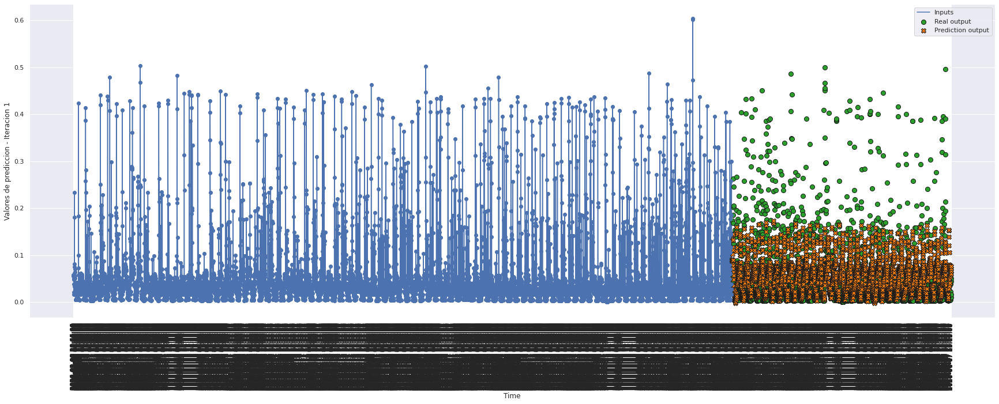

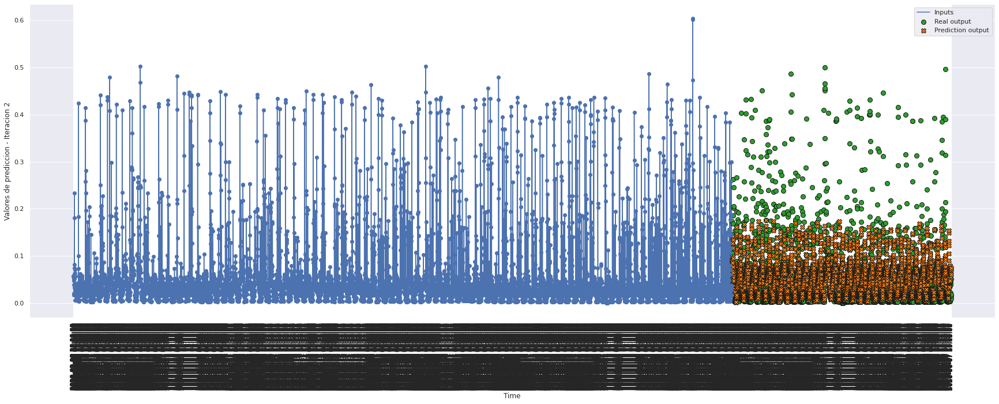

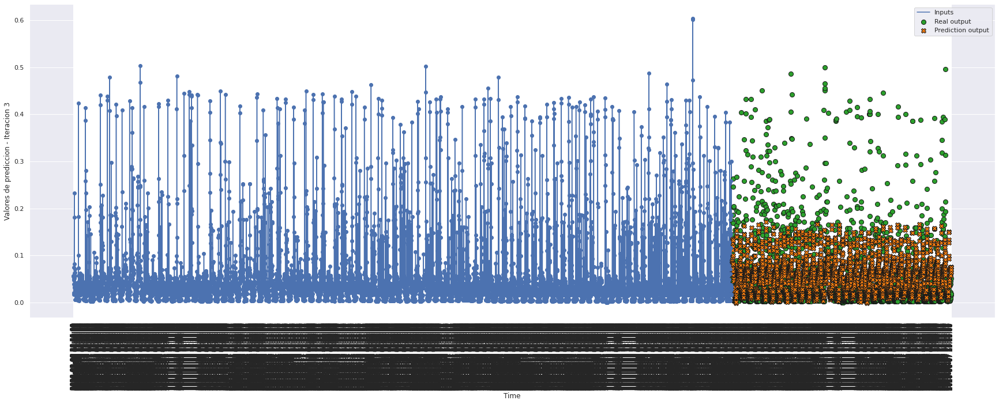

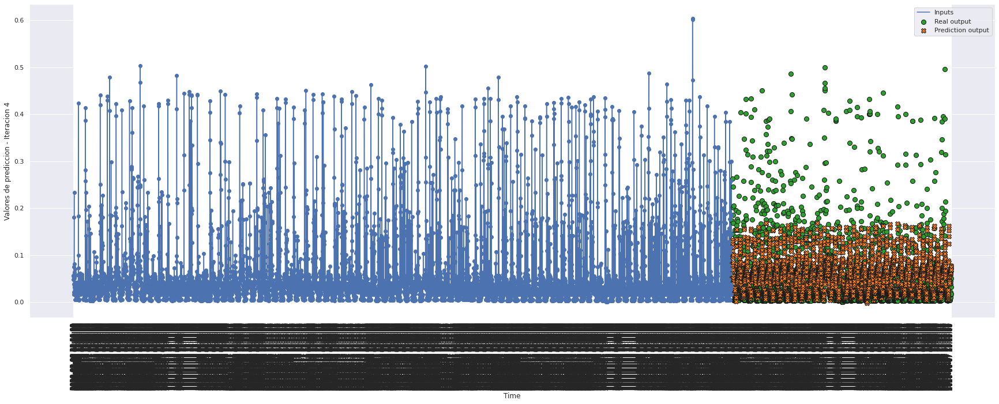

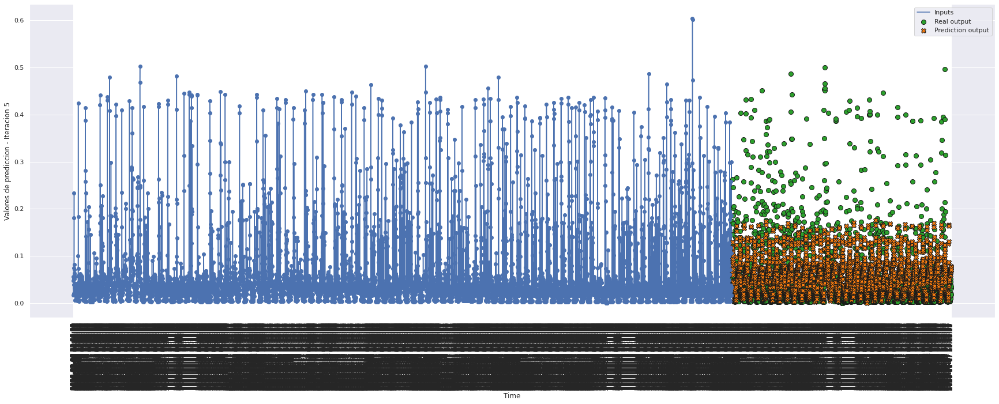

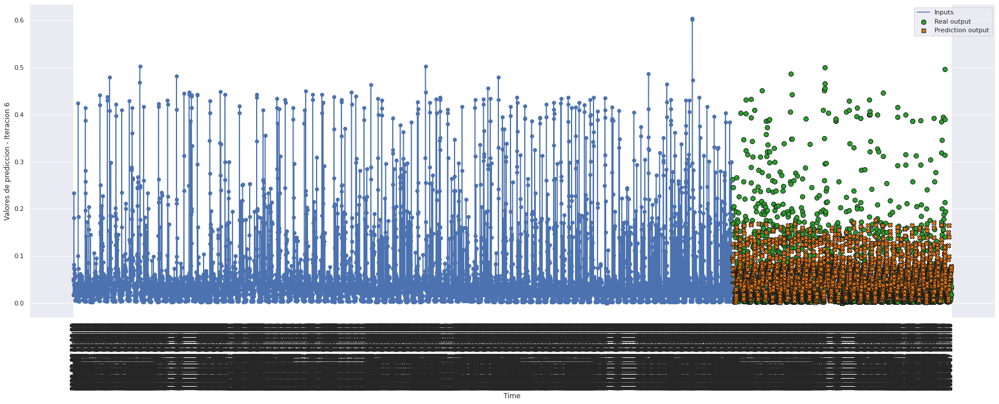

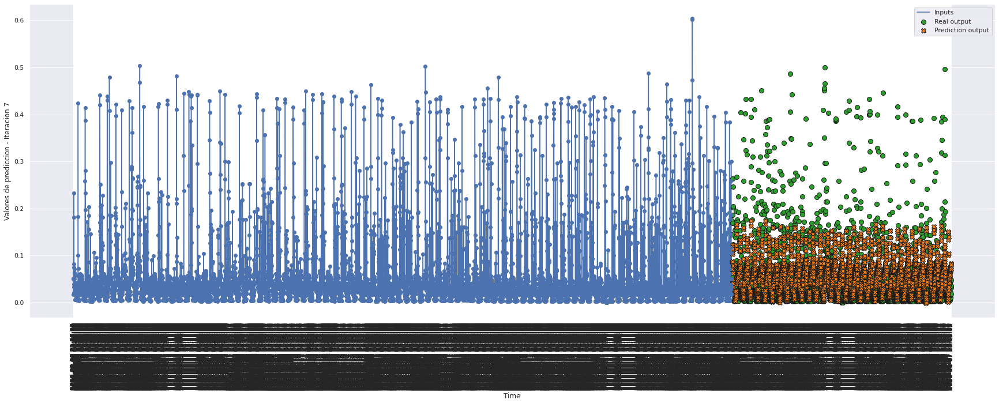

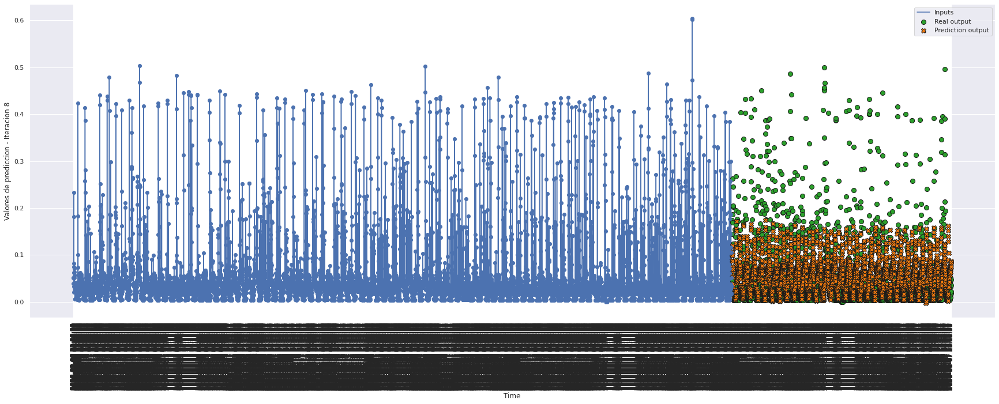

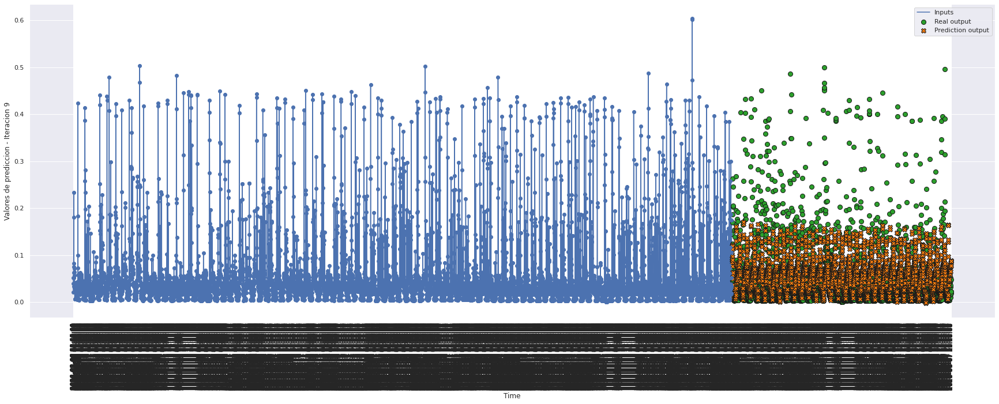

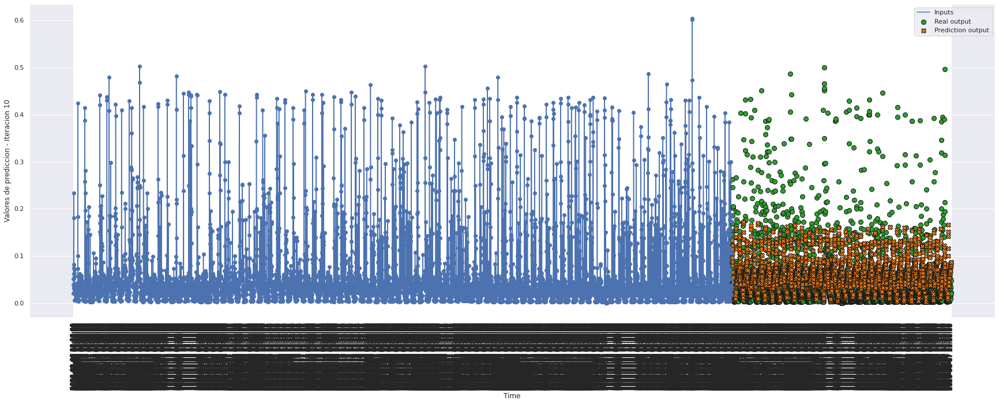

In [43]:
sns.set(rc = {'figure.figsize':(30,10)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict2, 10, 0)

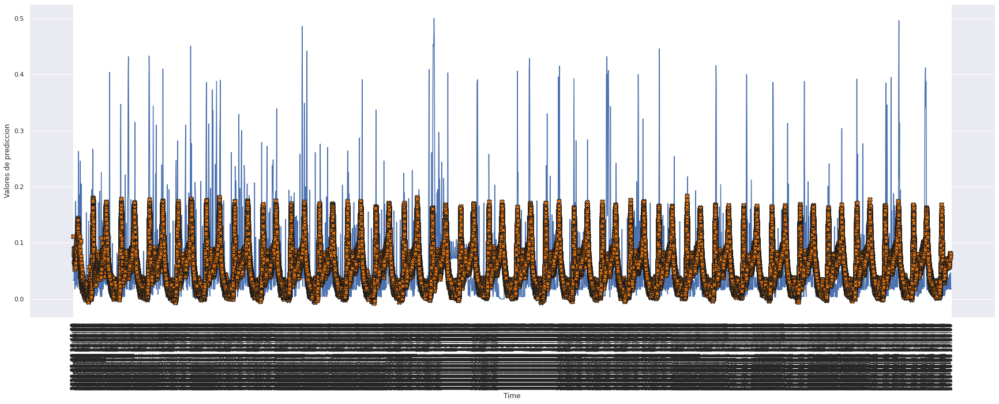

In [44]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict2, 100)

# MODELO 10: GRU UNA CAPA

### Construimos el modelo

In [45]:
def build_model10():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [46]:
model10 = build_model10()
model10.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 128)               50304     
                                                                 
 dense_1 (Dense)             (None, 2880)              371520    
                                                                 
Total params: 421,824
Trainable params: 421,824
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [47]:
history10 = model10.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
213/213 [==============================] - 77s 357ms/step - loss: 0.0073 - mae: 0.0508 - mse: 0.0073 - smape: 0.9359 - val_loss: 0.0070 - val_mae: 0.0504 - val_mse: 0.0070 - val_smape: 1.0072
Epoch 2/200
213/213 [==============================] - 75s 353ms/step - loss: 0.0068 - mae: 0.0495 - mse: 0.0068 - smape: 0.9018 - val_loss: 0.0067 - val_mae: 0.0495 - val_mse: 0.0067 - val_smape: 1.0012
Epoch 3/200
213/213 [==============================] - 75s 353ms/step - loss: 0.0064 - mae: 0.0484 - mse: 0.0064 - smape: 0.8942 - val_loss: 0.0067 - val_mae: 0.0490 - val_mse: 0.0067 - val_smape: 0.9847
Epoch 4/200
213/213 [==============================] - 76s 358ms/step - loss: 0.0062 - mae: 0.0472 - mse: 0.0062 - smape: 0.8592 - val_loss: 0.0071 - val_mae: 0.0517 - val_mse: 0.0071 - val_smape: 1.0282
Epoch 5/200
213/213 [==============================] - 75s 353ms/step - loss: 0.0060 - mae: 0.0466 - mse: 0.0060 - smape: 0.8535 - val_loss: 0.0067 - val_mae: 0.0488 - val_mse: 0.0067 

In [48]:
hist10 = pd.DataFrame(history10.history)
hist10['epoch'] = history10.epoch
hist10

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.007288,0.050791,0.007288,0.935924,0.006967,0.050428,0.006967,1.007203,0
1,0.006797,0.049506,0.006797,0.901842,0.006748,0.049530,0.006748,1.001218,1
2,0.006402,0.048384,0.006402,0.894210,0.006687,0.048954,0.006687,0.984733,2
3,0.006198,0.047247,0.006198,0.859224,0.007121,0.051736,0.007121,1.028164,3
4,0.006032,0.046630,0.006032,0.853516,0.006656,0.048813,0.006656,0.969018,4
5,0.005927,0.045986,0.005927,0.839487,0.006795,0.049320,0.006795,0.971811,5
6,0.005977,0.046042,0.005977,0.841999,0.006949,0.050353,0.006949,0.994635,6
7,0.005841,0.045405,0.005841,0.831055,0.006733,0.048817,0.006733,0.973956,7
8,0.006420,0.048155,0.006420,0.869971,0.007203,0.051722,0.007203,1.015362,8
9,0.007005,0.050815,0.007005,0.910043,0.007147,0.050977,0.007147,1.006607,9


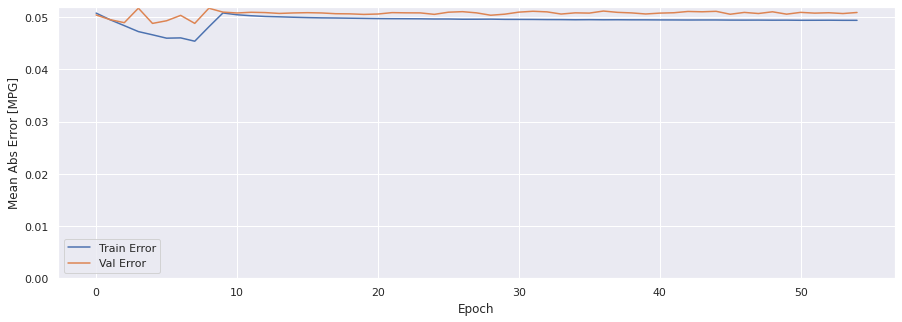

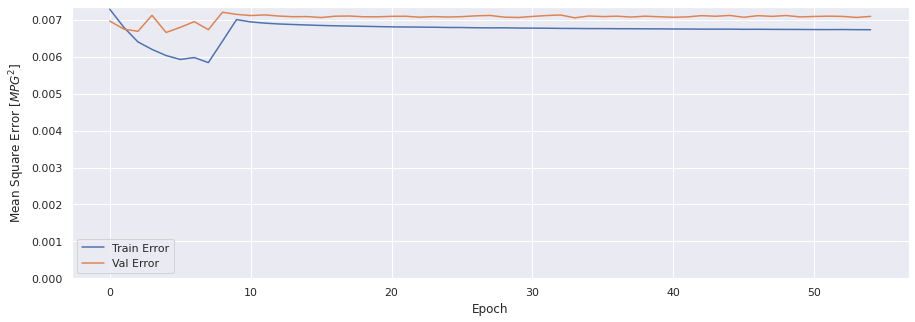

In [49]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history10)

### Evaluar predicciones

In [50]:
score_train10 = model10.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train10[0]}')
print(f'MAE:{score_train10[1]}')
print(f'MSE:{score_train10[2]}')
print(f'SMAPE:{score_train10[3]}')

852/852 [==============================] - 117s 137ms/step - loss: 0.0067 - mae: 0.0494 - mse: 0.0067 - smape: 0.8934
Loss:0.006729108281433582
MAE:0.04941195622086525
MSE:0.006729108281433582
SMAPE:0.8934267163276672


In [51]:
score_val10 = model10.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val10[0]}')
print(f'MAE:{score_val10[1]}')
print(f'MSE:{score_val10[2]}')
print(f'SMAPE:{score_val10[3]}')

44/44 [==============================] - 6s 137ms/step - loss: 0.0071 - mae: 0.0509 - mse: 0.0071 - smape: 1.0054
Loss:0.0070922826416790485
MAE:0.050906792283058167
MSE:0.0070922826416790485
SMAPE:1.0053551197052002


In [52]:
score_test10 = model10.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test10[0]}')
print(f'MAE:{score_test10[1]}')
print(f'MSE:{score_test10[2]}')
print(f'SMAPE:{score_test10[3]}')

44/44 [==============================] - 6s 137ms/step - loss: 0.0060 - mae: 0.0517 - mse: 0.0060 - smape: 1.0417
Loss:0.005962844472378492
MAE:0.05174567550420761
MSE:0.005962844472378492
SMAPE:1.0416847467422485


### Comparativa de resultados

In [53]:
result = hist10.iloc[-1]
comparativa10 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test10[1], score_test10[2], score_test10[3], math.sqrt(score_test10[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa10.style.set_caption("Método de ventana de varios pasos - GRU una capa")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.049405,0.006731,0.892870,0.082044
VALIDACION,0.050907,0.007092,1.005272,0.084216
TEST,0.051746,0.005963,1.041685,0.077219


### Obtener predicciones

In [54]:
trainPredict10 = model10.predict(scaled_trainX)
testPredict10 = model10.predict(scaled_testX)

### Visualización de las predicciones

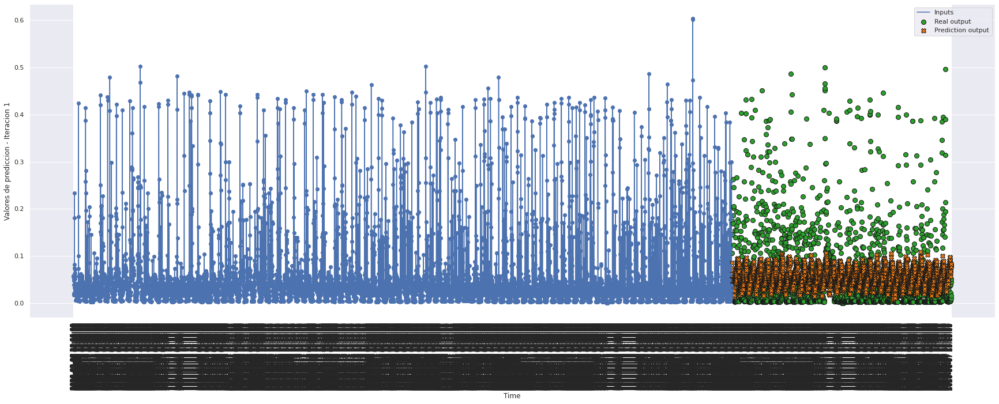

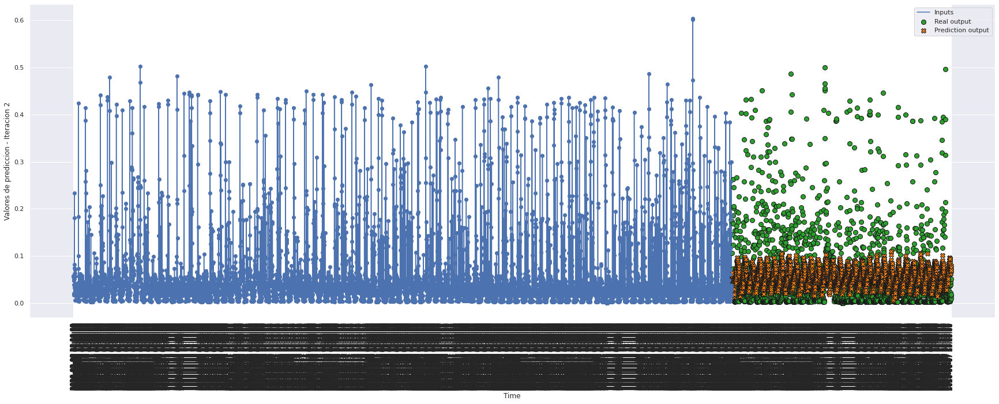

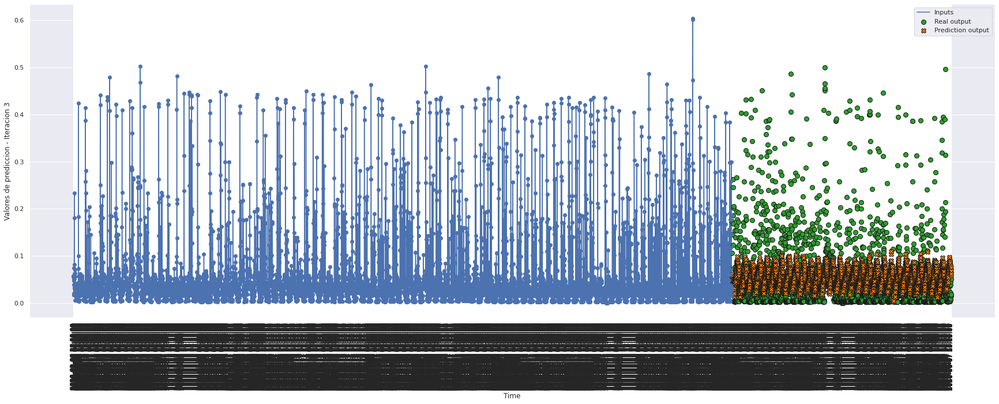

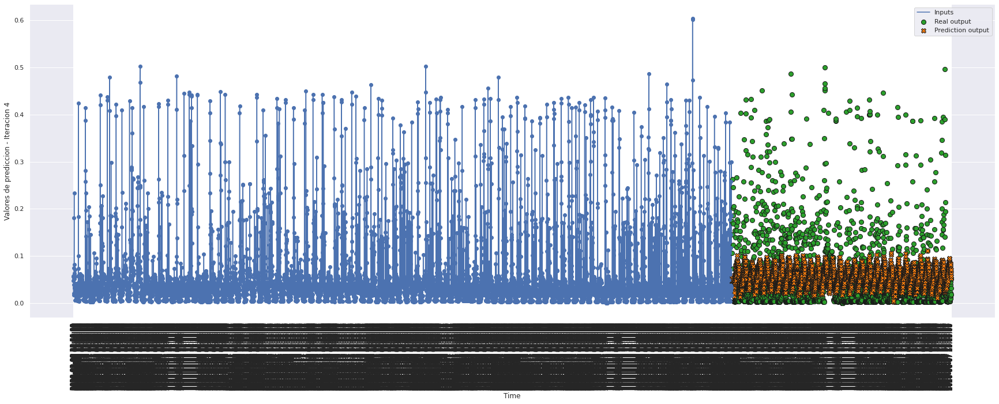

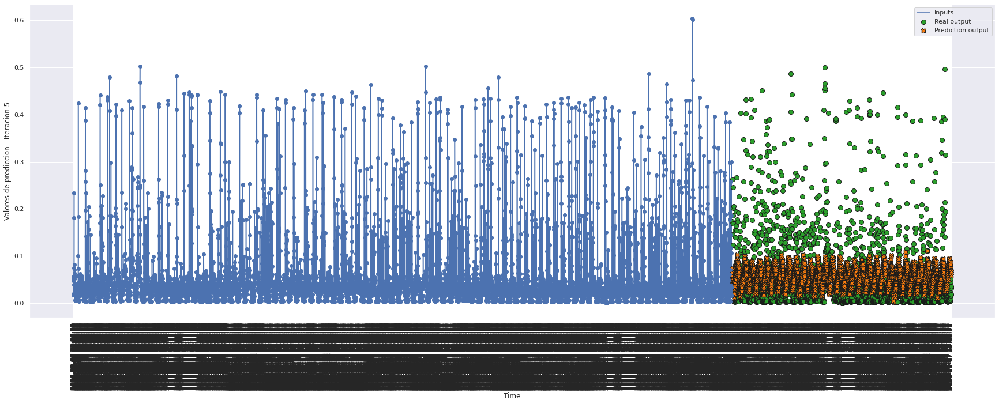

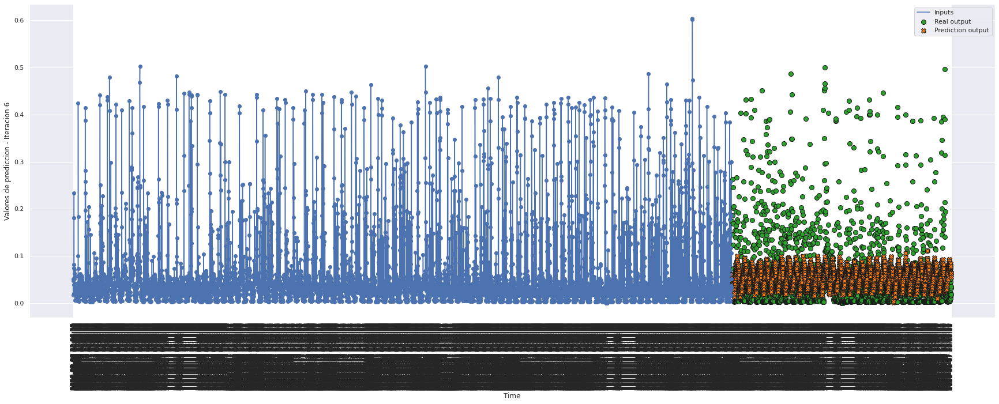

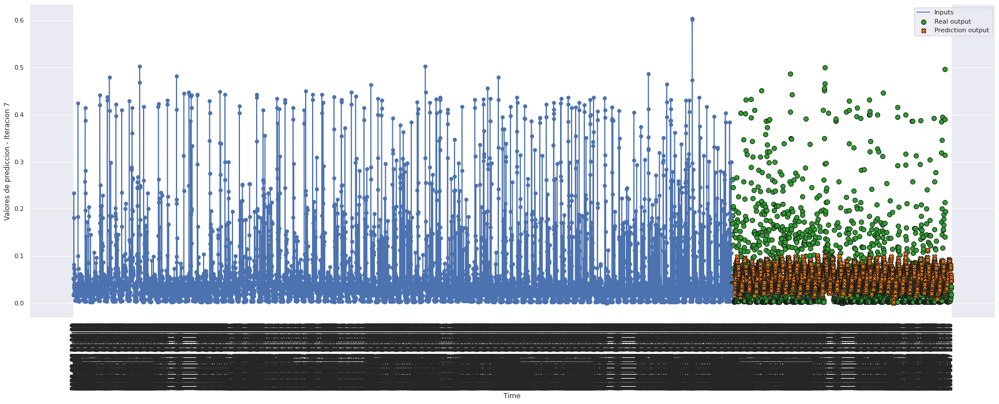

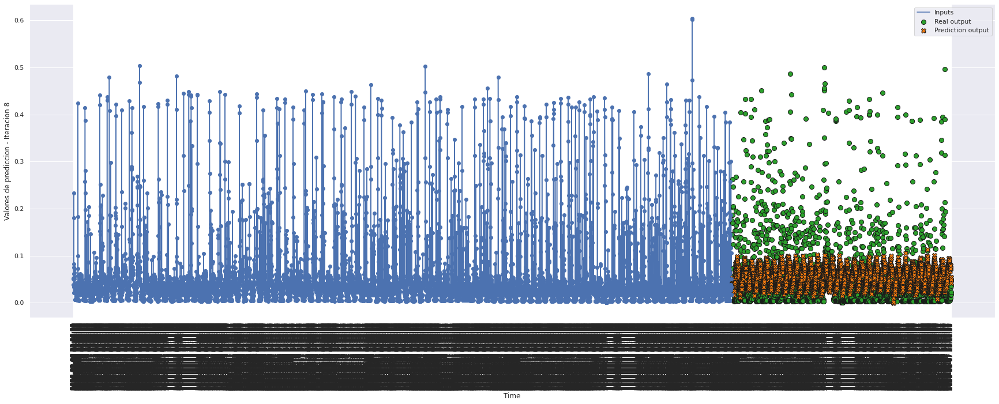

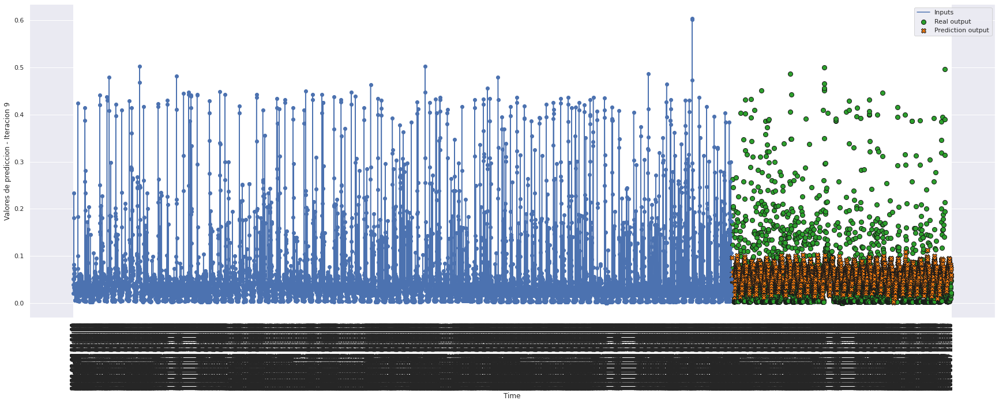

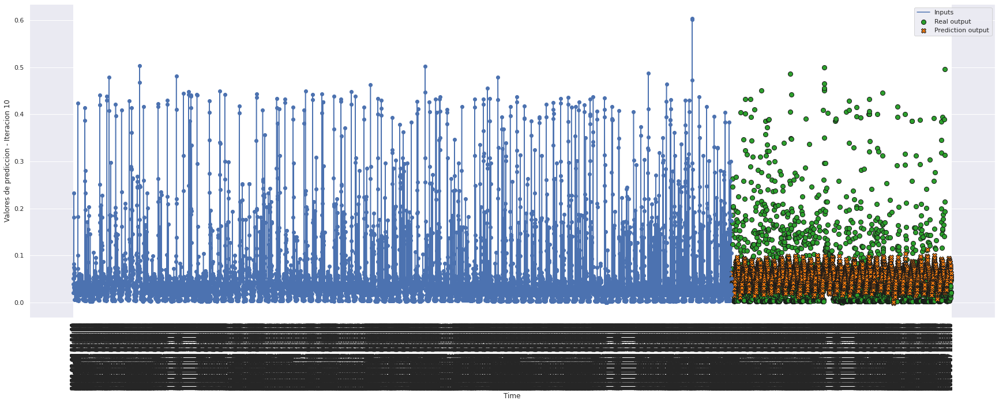

In [55]:
sns.set(rc = {'figure.figsize':(30,10)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict10, 10, 0)

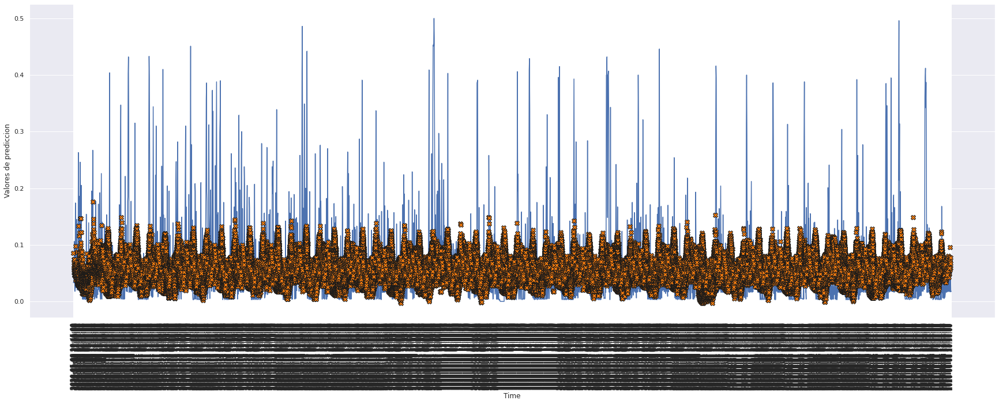

In [56]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict10, 100)

# MODELO 11: GRU DOS CAPAS

### Construimos el modelo

In [57]:
def build_model11():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh', return_sequences=True),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [58]:
model11 = build_model11()
model11.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 8640, 128)         50304     
                                                                 
 gru_2 (GRU)                 (None, 128)               99072     
                                                                 
 dense_2 (Dense)             (None, 2880)              371520    
                                                                 
Total params: 520,896
Trainable params: 520,896
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [59]:
history11 = model11.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
213/213 [==============================] - 170s 788ms/step - loss: 0.0072 - mae: 0.0508 - mse: 0.0072 - smape: 0.9359 - val_loss: 0.0069 - val_mae: 0.0501 - val_mse: 0.0069 - val_smape: 1.0064
Epoch 2/200
213/213 [==============================] - 167s 785ms/step - loss: 0.0067 - mae: 0.0492 - mse: 0.0067 - smape: 0.9020 - val_loss: 0.0066 - val_mae: 0.0496 - val_mse: 0.0066 - val_smape: 1.0002
Epoch 3/200
213/213 [==============================] - 167s 786ms/step - loss: 0.0063 - mae: 0.0478 - mse: 0.0063 - smape: 0.8779 - val_loss: 0.0066 - val_mae: 0.0491 - val_mse: 0.0066 - val_smape: 0.9853
Epoch 4/200
213/213 [==============================] - 168s 788ms/step - loss: 0.0061 - mae: 0.0471 - mse: 0.0061 - smape: 0.8648 - val_loss: 0.0067 - val_mae: 0.0496 - val_mse: 0.0067 - val_smape: 0.9882
Epoch 5/200
213/213 [==============================] - 167s 785ms/step - loss: 0.0060 - mae: 0.0462 - mse: 0.0060 - smape: 0.8470 - val_loss: 0.0068 - val_mae: 0.0492 - val_mse: 0.

In [60]:
hist11 = pd.DataFrame(history11.history)
hist11['epoch'] = history11.epoch
hist11

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.007240,0.050814,0.007240,0.935867,0.006950,0.050081,0.006950,1.006432,0
1,0.006665,0.049200,0.006665,0.902023,0.006629,0.049566,0.006629,1.000202,1
2,0.006294,0.047815,0.006294,0.877921,0.006646,0.049095,0.006646,0.985273,2
3,0.006134,0.047104,0.006134,0.864770,0.006676,0.049623,0.006676,0.988167,3
4,0.005978,0.046238,0.005978,0.847031,0.006785,0.049227,0.006785,0.974061,4
...,...,...,...,...,...,...,...,...,...
68,0.007248,0.052012,0.007248,0.922007,0.007179,0.051727,0.007179,1.015083,68
69,0.007243,0.051986,0.007243,0.921711,0.007147,0.050648,0.007147,1.004068,69
70,0.007261,0.052098,0.007261,0.922774,0.007155,0.051040,0.007155,1.008751,70
71,0.007251,0.052043,0.007251,0.922366,0.007169,0.051715,0.007169,1.015819,71


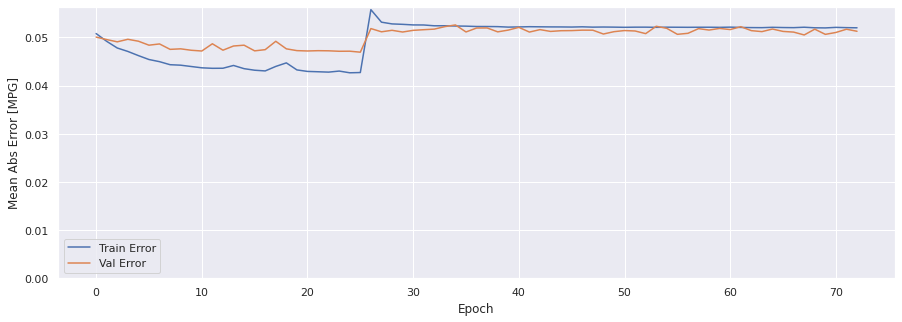

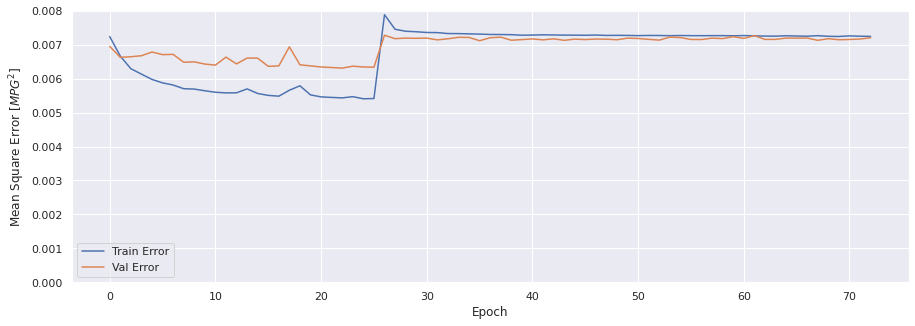

In [61]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history11)

### Evaluar predicciones

In [62]:
score_train11 = model11.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train11[0]}')
print(f'MAE:{score_train11[1]}')
print(f'MSE:{score_train11[2]}')
print(f'SMAPE:{score_train11[3]}')

852/852 [==============================] - 225s 264ms/step - loss: 0.0073 - mae: 0.0521 - mse: 0.0073 - smape: 0.9219
Loss:0.007287866901606321
MAE:0.05206949636340141
MSE:0.007287866901606321
SMAPE:0.9218835830688477


In [63]:
score_val11 = model11.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val11[0]}')
print(f'MAE:{score_val11[1]}')
print(f'MSE:{score_val11[2]}')
print(f'SMAPE:{score_val11[3]}')

44/44 [==============================] - 12s 268ms/step - loss: 0.0072 - mae: 0.0513 - mse: 0.0072 - smape: 1.0096
Loss:0.007204596884548664
MAE:0.05128811299800873
MSE:0.007204596884548664
SMAPE:1.009615421295166


In [64]:
score_test11 = model11.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test11[0]}')
print(f'MAE:{score_test11[1]}')
print(f'MSE:{score_test11[2]}')
print(f'SMAPE:{score_test11[3]}')

44/44 [==============================] - 12s 266ms/step - loss: 0.0062 - mae: 0.0527 - mse: 0.0062 - smape: 1.0460
Loss:0.006201592274010181
MAE:0.05271240323781967
MSE:0.006201592274010181
SMAPE:1.0460033416748047


### Comparativa de resultados

In [65]:
result = hist11.iloc[-1]
comparativa11 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test11[1], score_test11[2], score_test11[3], math.sqrt(score_test11[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa11.style.set_caption("Método de ventana de varios pasos - GRU dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.052008,0.007245,0.921958,0.085120
VALIDACION,0.051288,0.007205,1.009622,0.084880
TEST,0.052712,0.006202,1.046003,0.078750


### Obtener predicciones

In [66]:
trainPredict11 = model11.predict(scaled_trainX)
testPredict11 = model11.predict(scaled_testX)

### Visualización de las predicciones

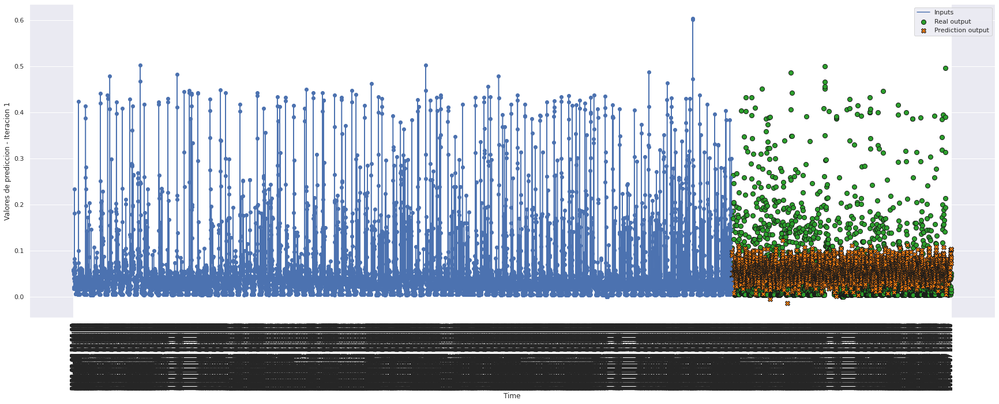

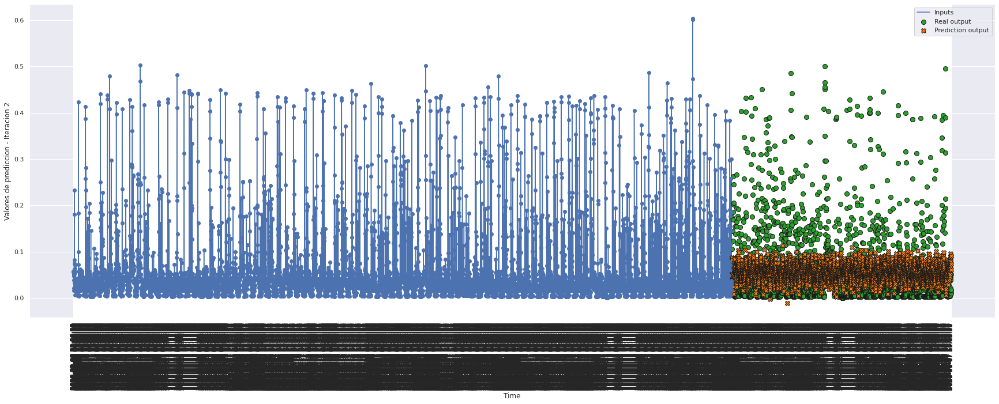

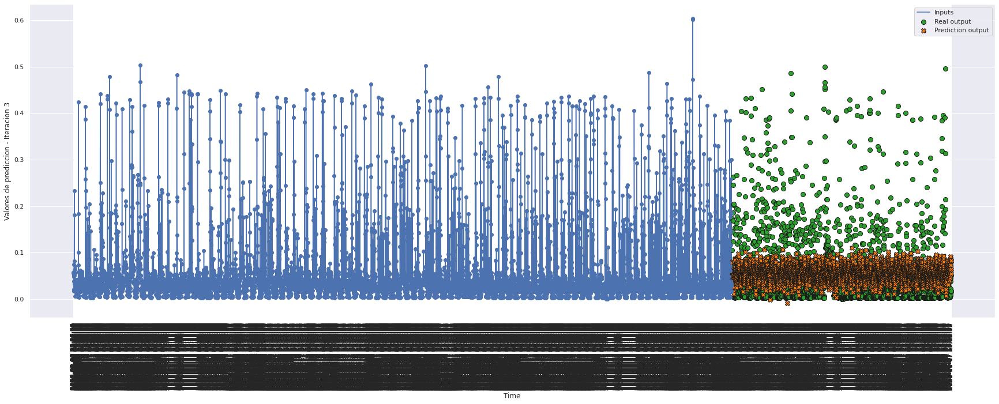

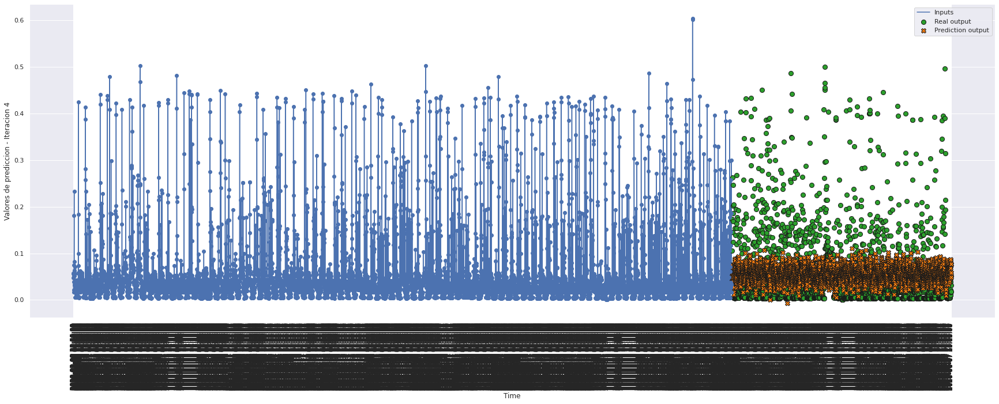

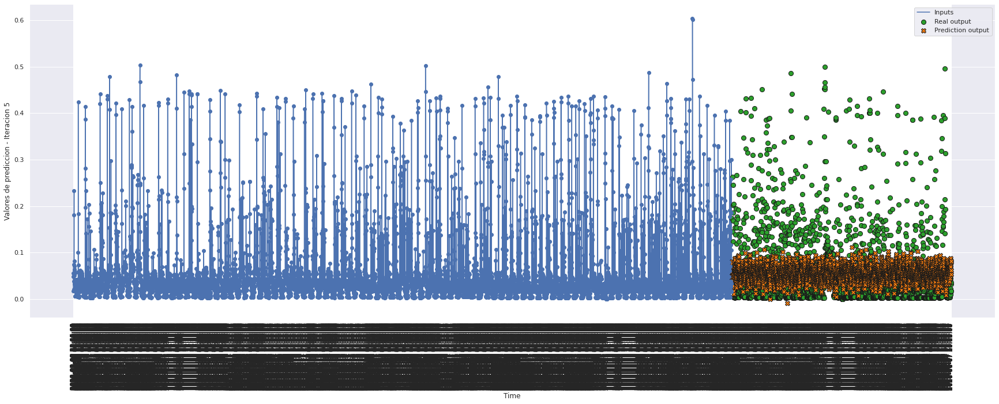

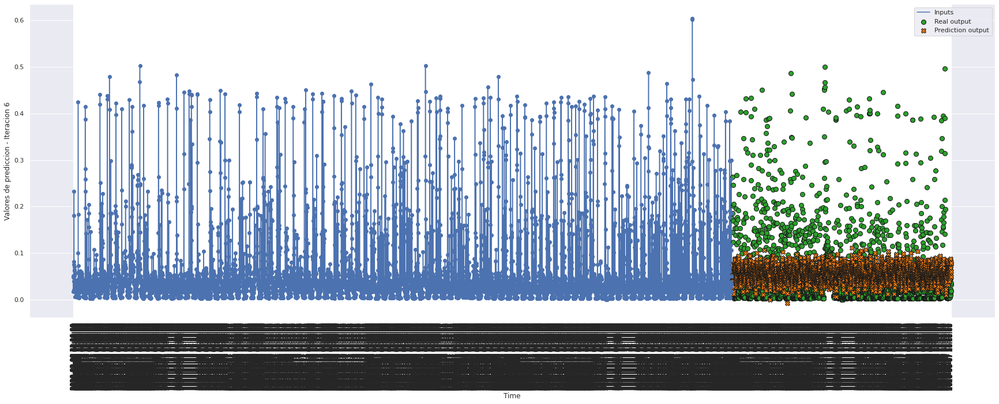

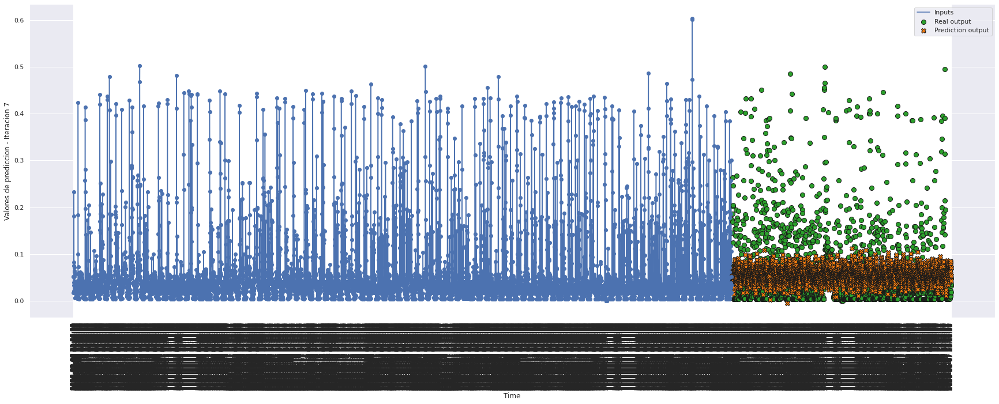

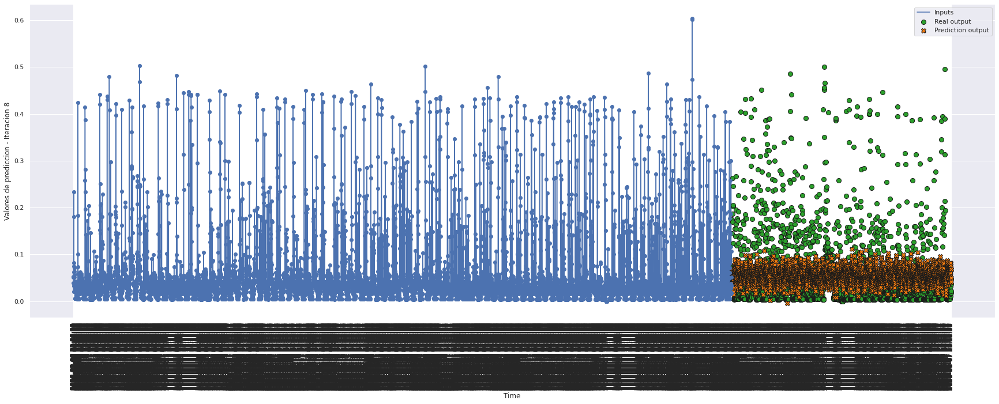

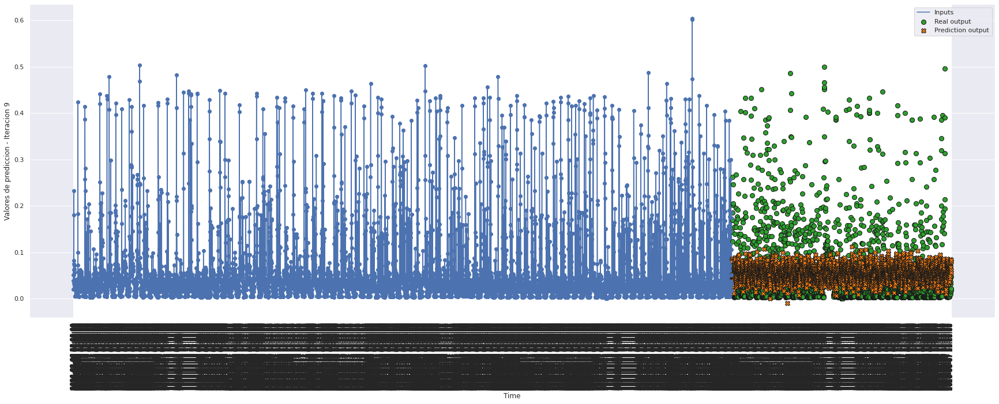

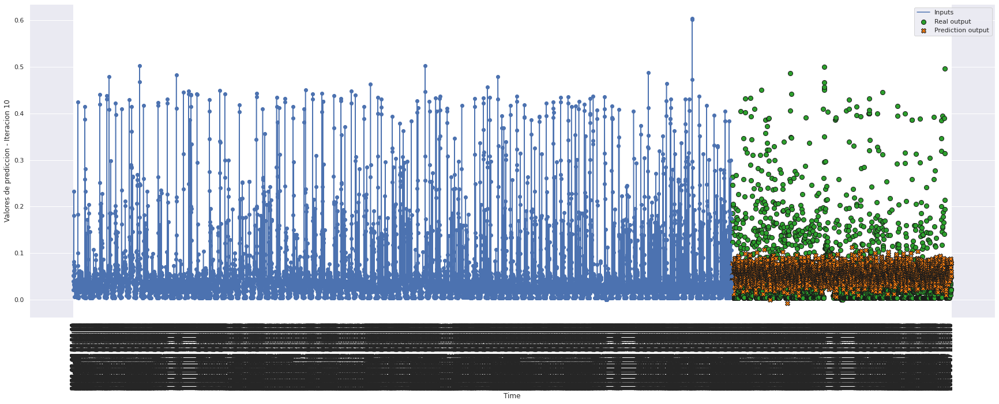

In [67]:
sns.set(rc = {'figure.figsize':(30,10)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict11, 10, 0)

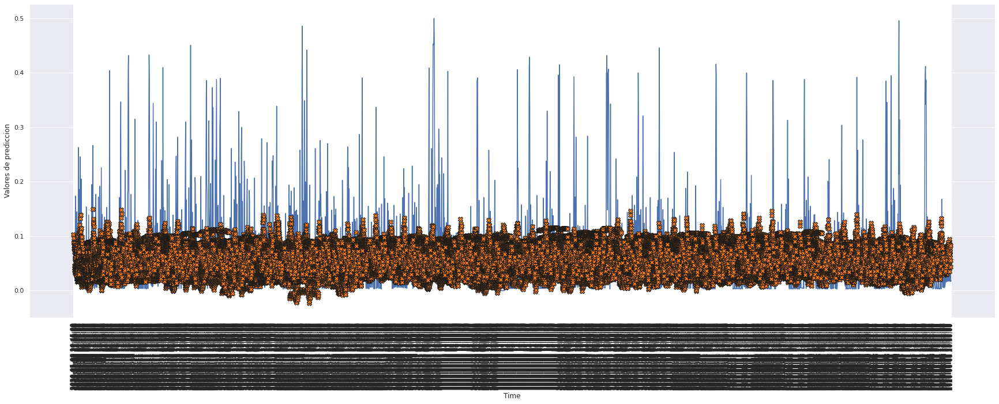

In [68]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict11, 100)

# Comparación de modelos

In [69]:
idx = ['LSTM 2 Layer', 'GRU 1 Layer', 'GRU 2 Layer']

col = ['TR_MAE', 'TR_MSE', 'TR_SMAPE', 'TR_RMSE',
       'V_MAE', 'V_MSE', 'V_SMAPE', 'V_RMSE',
       'TS_MAE', 'TS_MSE', 'TS_SMAPE', 'TS_RMSE']

datos = [[score_train2[1], score_train2[2], score_train2[3], math.sqrt(score_train2[2]),
            score_val2[1],   score_val2[2],   score_val2[3],   math.sqrt(score_val2[2]),
           score_test2[1],  score_test2[2],  score_test2[3],  math.sqrt(score_test2[2])],
         [score_train10[1], score_train10[2], score_train10[3], math.sqrt(score_train10[2]),
            score_val10[1],   score_val10[2],   score_val10[3],   math.sqrt(score_val10[2]),
           score_test10[1],  score_test10[2],  score_test10[3],  math.sqrt(score_test10[2])],
         [score_train11[1], score_train11[2], score_train11[3], math.sqrt(score_train11[2]),
            score_val11[1],   score_val11[2],   score_val11[3],   math.sqrt(score_val11[2]),
           score_test11[1],  score_test11[2],  score_test11[3],  math.sqrt(score_test11[2])]]

comparativa = pd.DataFrame(datos, columns = col, index = idx)
comparativa.style.set_caption("Tabla de comparación de todos los modelos - Método de ventana sólo valor 8640 - 2880")

,TR_MAE,TR_MSE,TR_SMAPE,TR_RMSE,V_MAE,V_MSE,V_SMAPE,V_RMSE,TS_MAE,TS_MSE,TS_SMAPE,TS_RMSE
LSTM 2 Layer,0.041590,0.005111,0.784326,0.071494,0.050271,0.006680,1.006028,0.081733,0.049132,0.005652,0.984324,0.075181
GRU 1 Layer,0.049412,0.006729,0.893427,0.082031,0.050907,0.007092,1.005355,0.084216,0.051746,0.005963,1.041685,0.077219
GRU 2 Layer,0.052069,0.007288,0.921884,0.085369,0.051288,0.007205,1.009615,0.084880,0.052712,0.006202,1.046003,0.078750


<AxesSubplot:title={'center':'Comparativa del error en los modelos para el mes del método de ventana de varios pasos sólo valor'}>

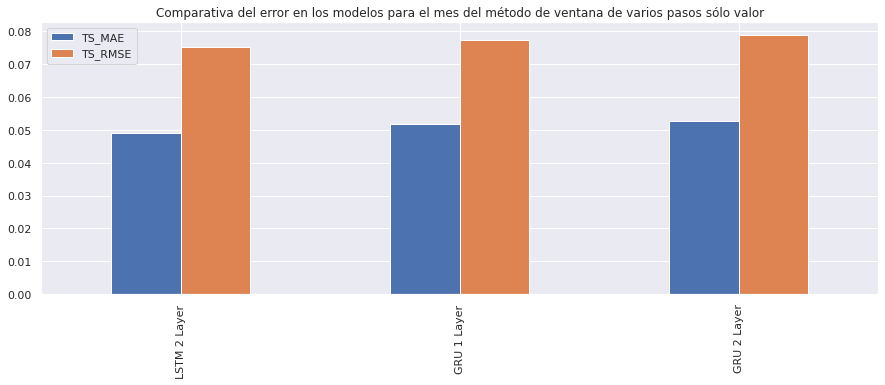

In [70]:
sns.set(rc = {'figure.figsize':(15,5)})
comparativa.loc[:, ['TS_MAE', 'TS_RMSE']].plot(kind='bar', title = 'Comparativa del error en los modelos para el mes del método de ventana de varios pasos sólo valor')

<AxesSubplot:title={'center':'Comparativa del error porcentual absoluto medio simétrico para el mes del método de ventana de varios pasos sólo valor'}>

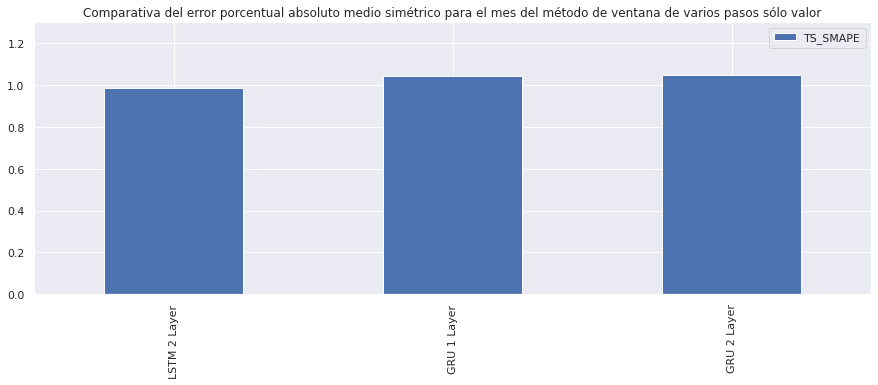

In [74]:
sns.set(rc = {'figure.figsize':(15,5)})
comparativa.loc[:, 'TS_SMAPE'].plot(kind='bar', legend=(['SMAPE']), ylim=(0, 1.3), 
                    title = 'Comparativa del error porcentual absoluto medio simétrico para el mes del método de ventana de varios pasos sólo valor')

# Elección de modelo

In [72]:
model11.save('../../models/only_value/monthModel/1/')

2022-06-26 02:52:52.237963: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: ../../models/only_value/monthModel/1/assets


INFO:tensorflow:Assets written to: ../../models/only_value/monthModel/1/assets
